<center>

## **EDA (Exploratory Data Analysis)**<br>
**_PROYECTO INDIVIDUAL 1_**<br>

</center>

**Machine Learning Operations (MLOps)**<br>
**Data Scientis:** _Ilbert Ferney Alarcon_ 😎<br>
**Cohorte 11**<br>

-------------

### **1. Importar Librerias**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import session_info
import ydata_profiling as pp
from wordcloud import WordCloud

### **2. Establecer apariencia general de los gráficos**

In [2]:
%matplotlib inline
sns.set_style(style='whitegrid')
sns.set_context(context='notebook')
plt.rcParams['figure.figsize'] = (11, 9.4)


### **3. Cargar los datos**

In [3]:
etlmovies_df=pd.read_csv('DATASET\Movies_ETL_ILB.csv',encoding='UTF-8')

In [4]:
etlmovies_df.head(3)

,budget,id,original_language,overview,popularity,release_date,revenue,runtime,status,title,...,idgenres,pcomp_names,idpcomp,pcountries_names,iso_pcountries,spokelang_name,iso_spokelang,namescast,idcast,directors
0,30000000.0,862,en,"Led by Woody, Andys toys live happily in his r...",21.946943,1995-10-30,373554033.0,81.0,Released,Toy Story,...,"16, 35, 10751",Pixar Animation Studios,3,United States of America,US,English,en,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...","31, 12898, 7167, 12899, 12900, 7907, 8873, 111...",John Lasseter
1,65000000.0,8844,en,When siblings Judy and Peter discover an encha...,17.015540,1995-12-15,262797249.0,104.0,Released,Jumanji,...,"12, 14, 10751","TriStar Pictures, Teitler Film, Interscope Com...","559, 2550, 10201",United States of America,US,"English, FranÃÂ§ais","en, fr","Robin Williams, Jonathan Hyde, Kirsten Dunst, ...","2157, 8537, 205, 145151, 5149, 10739, 58563, 1...",Joe Johnston
2,0.0,15602,en,A family wedding reignites the ancient feud be...,11.712900,1995-12-22,0.0,101.0,Released,Grumpier Old Men,...,"10749, 35","Warner Bros., Lancaster Gate","6194, 19464",United States of America,US,English,en,"Walter Matthau, Jack Lemmon, Ann-Margret, Soph...","6837, 3151, 13567, 16757, 589, 16523, 7166",Howard Deutch


---------------

### **4.Analisis Preliminar de Variables**

In [5]:
pp.ProfileReport(etlmovies_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

---------------

### **5. Validacion de datos**

¿Qué tipo de dato son las variables del conjunto de datos?

In [6]:
etlmovies_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45345 entries, 0 to 45344
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   budget             45345 non-null  float64
 1   id                 45345 non-null  int64  
 2   original_language  45334 non-null  object 
 3   overview           44404 non-null  object 
 4   popularity         45345 non-null  float64
 5   release_date       45345 non-null  object 
 6   revenue            45345 non-null  float64
 7   runtime            45099 non-null  float64
 8   status             45265 non-null  object 
 9   title              45345 non-null  object 
 10  vote_average       45345 non-null  float64
 11  vote_count         45345 non-null  float64
 12  return             45345 non-null  float64
 13  release_year       45345 non-null  int64  
 14  genres_name        42962 non-null  object 
 15  idgenres           42962 non-null  object 
 16  pcomp_names        335

In [7]:
(etlmovies_df.isnull().sum().sort_values(ascending=False))

idpcomp              11788
pcomp_names          11788
iso_pcountries        6207
pcountries_names      6207
spokelang_name        3888
iso_spokelang         3765
idgenres              2383
genres_name           2383
idcast                2348
namescast             2348
overview               941
directors              835
runtime                246
status                  80
original_language       11
budget                   0
release_year             0
id                       0
vote_count               0
vote_average             0
title                    0
revenue                  0
release_date             0
popularity               0
return                   0
dtype: int64

¿Cuántas variables de cada tipo de dato tenemos en el conjunto de datos?

In [8]:
(etlmovies_df.dtypes.value_counts())

object     16
float64     7
int64       2
dtype: int64

¿Existen valores nulos explícitos en el conjunto de datos?

¿Cuál es la proporción de valores nulos por cada variable?

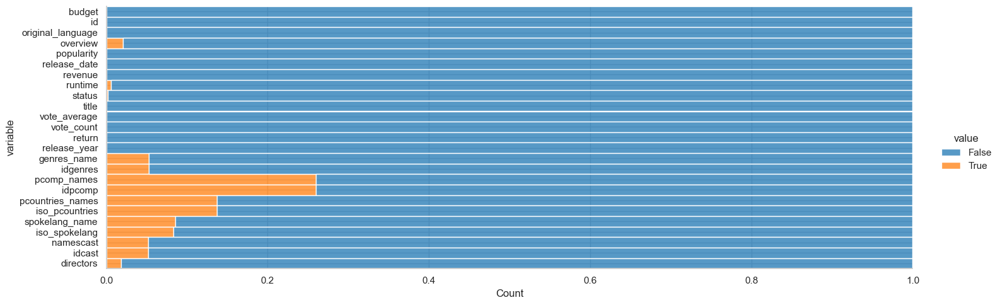

In [9]:
(
    etlmovies_df
    .isnull()
    .melt()
    .pipe(
        lambda df:(
            sns.displot(
                data=df,
                y='variable',
                hue='value',
                multiple='fill',
                aspect=3
            )
        )
    )
)

In [10]:
filas_con_nulos = etlmovies_df[etlmovies_df.isnull().any(axis=1)]

df_nulos = pd.DataFrame(filas_con_nulos)

df_nulos

,budget,id,original_language,overview,popularity,release_date,revenue,runtime,status,title,...,idgenres,pcomp_names,idpcomp,pcountries_names,iso_pcountries,spokelang_name,iso_spokelang,namescast,idcast,directors
32,0.0,78802,fr,NaN,0.745542,1996-09-18,0.0,50.0,Released,Wings of Courage,...,"10749, 12",Iwerks Entertainment,70801,"France, United States of America","FR, US",English,en,"Craig Sheffer, Elizabeth McGovern, Tom Hulce, ...","4138, 4513, 3999, 58406, 554094, 5576, 156330",Jean-Jacques Annaud
50,0.0,117164,en,Detective - turned - bodyguard Cynthia McKay (...,0.595949,1994-11-22,0.0,93.0,Released,Guardian Angel,...,"28, 53, 18",NaN,NaN,NaN,NaN,NaN,NaN,"Cynthia Rothrock, Marshall R. Teague, Daniel M...","74375, 63941, 1093379, 42137, 53552, 112159, 6...",Richard W. Munchkin
52,0.0,49133,it,"Fiore, an Italian conman, arrives in post Comm...",1.361286,1994-01-01,0.0,116.0,Released,Lamerica,...,"18, 10769",NaN,NaN,"Italy, France, Switzerland","IT, FR, CH","shqip, Italiano","sq, it","Enrico Lo Verso, Michele Placido, Piro Milkani...","27392, 25819, 1149435, 1180060, 1904515",Gianni Amelio
55,0.0,124057,en,"Set in modern times, Alex finds King Arthurs s...",0.307075,1997-07-08,0.0,89.0,Released,Kids of the Round Table,...,NaN,"Telefilm Canada, Melenny Productions","7320, 10260",NaN,NaN,English,en,"Johnny Morina, Malcolm McDowell, Maggie Castle...","198643, 56890, 41743, 1569328, 11086",Robert Tinnell
57,0.0,11010,it,Simple Italian postman learns to love poetry w...,10.168437,1994-09-22,0.0,108.0,Released,The Postman,...,"35, 18, 10749",NaN,NaN,"Belgium, France, Italy","BE, FR, IT","Italiano, EspaÃÂ±ol","it, es","Philippe Noiret, Massimo Troisi, Maria Grazia ...","24366, 67792, 10777, 14149, 538696, 24290, 225...",Michael Radford
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45335,0.0,67179,it,Sentenced to life imprisonment for illegal act...,0.225051,1972-01-01,0.0,90.0,Released,St. Michael Had a Rooster,...,NaN,NaN,NaN,NaN,NaN,Italiano,it,"Giulio Brogi, Renato CestiÃÂ¨, Vito Cipolla, ...","225962, 548190, 548191, 919804","Paolo Taviani, Vittorio Taviani"
45337,0.0,390959,en,"In this true-crime documentary, we delve into ...",0.076061,2000-10-22,0.0,45.0,Released,Shadow of the Blair Witch,...,"9648, 27",NaN,NaN,NaN,NaN,English,en,"Tony Abatemarco, Andre Brooks, Mariclare Coste...","53303, 204174, 79736, 1099459, 1599751, 159975...",Ben Rock
45341,0.0,111109,tl,An artist struggles to finish his work while a...,0.178241,2011-11-17,0.0,360.0,Released,Century of Birthing,...,18,Sine Olivia,19653,Philippines,PH,NaN,tl,"Angel Aquino, Perry Dizon, Hazel Orencio, Joel...","1043186, 111636, 1204271, 278923, 1042953, 575...",Lav Diaz
45343,0.0,227506,en,"In a small town live two brothers, one a minis...",0.003503,1917-10-21,0.0,87.0,Released,Satan Triumphant,...,NaN,Yermoliev,88753,Russia,RU,NaN,NaN,"Iwan Mosschuchin, Nathalie Lissenko, Pavel Pav...","544742, 1090923, 1136422, 1261758, 29199",Yakov Protazanov


**production_companies:** DE acuerdo a lo evidenciado en el proceso de ETL, la columna companies (_Lista con las compañias productoras asociadas a la película_), era un campo anidado por lo cual se crearon dos columnas **idpcomp** y **pcomp_names**, evidencian una gran cantidad de elementos nulos, sin embargo revisando a profundidad el Dataset, estas columnas no aportan mucha informacion al analisis ya que no todas las peliculas son sagas o franquicias.

In [11]:
etlmovies_df.drop(columns=['idpcomp','pcomp_names'], inplace=True)

**production_contries:** De acuerdo a lo evidenciado en el proceso de ETL, la columna original_language (_Lista con los paices donde se produjo la pelicula_), era un campo anidado por lo cual se crearon dos columnas **iso_pcontries** y **pcontries_names**, evidencian una gran cantidad de elementos nulos, sin embargo revisando a profundidad el Dataset, estas columnas no aportan mucha informacion al analisis ya que no todas las peliculas son sagas o franquicias.

In [12]:
etlmovies_df.drop(columns=['iso_pcountries','pcountries_names'], inplace=True)

**original_language:** De acuerdo a lo evidenciado en el proceso de ETL, la columna original_language (_Idioma original en la que se grabo la pelicula_), es un campo tipor object el cual contiene el identificador del idioma con que fue grabada la pelicula, evidenciando la relacion que tiene con los campos **iso_spokelang** se deciden completar los campo los el primer registro de la lista contenida en este campo.

In [13]:
etlmovies_df['original_language'] = etlmovies_df['original_language'].fillna(etlmovies_df['iso_spokelang'].str.split(',').str[0])

**spoken_languages:** De acuerdo a lo evidenciado en el proceso de ETL, la columna spoken es una campo anidado (_Lista con los idiomas que se hablan en la pelicula_), es un campo tipor object el cual contiene el identificador de los idiomas disponibles para la pelicula, evidenciando la relacion que tiene con los campos **original_language** se deciden completar los campo los el primer registro de la lista contenida en este campo, conforme a este concepto se elimina la columna **spokelang_name** ya que seria redundante con **iso_spokelang**.

In [14]:
etlmovies_df['iso_spokelang'] = etlmovies_df['iso_spokelang'].fillna(etlmovies_df['original_language'].str.split(',').str[0])
etlmovies_df.drop(columns=['spokelang_name'], inplace=True)

Las columnas que acotinuacion se listan, conforme al analisis realizado no contienen informacion de las columnas que se consideran relevantes **genres_name, namescast, directors**, se deduce que estos datos no fueron obtenidos por la persona encargada de recolectar los datos, sin embargo no se tiene la informacion para completar estos registros y asi puedan contribuir al modelo por lo cual se eliminan los registros mas no las columnas.

In [15]:
etlmovies_df = etlmovies_df.dropna(subset=['genres_name'])
etlmovies_df = etlmovies_df.dropna(subset=['namescast'])
etlmovies_df = etlmovies_df.dropna(subset=['directors'])

**runtime:** Hace referencia a Duración de la película, en minutos, lo cual la convierte en una variable numerica, dicho esto se propone rellenar las caldas vacias con el promedio lo cual no presentara modificacion en la distribucion de frecuencias en la variable o de sus medidas de tendencia central y/o medidas de dispersion.

In [16]:
promedio_runtime = etlmovies_df['runtime'].mean()
etlmovies_df['runtime'] = etlmovies_df['runtime'].fillna(promedio_runtime)

**status:** Hace referencia a Estado de la pelicula actual (si fue anunciada, si ya se estreno, etc), sin embargo tiene relacion con el campo **release_date** por lo cual el hecho de que el campo **release_date** tenga registro indicaria que esa pelicula ya fue estrenada por lo tanto se llena con el dato **Released**.

In [17]:
etlmovies_df['status'] = etlmovies_df['status'].fillna('Released')

**overview:** Este campo indica las reseñas que han tenido las peliculas, con base en la informacion analizada tiene variso campos vacion los cuales sin menores al 5% de los registros, esta columna se deja aun con espacion vacion ya que esta columna puede apoirtar informacion valiosa para un procesamiento de NLP.

In [18]:
etlmovies_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40946 entries, 0 to 45342
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   budget             40946 non-null  float64
 1   id                 40946 non-null  int64  
 2   original_language  40946 non-null  object 
 3   overview           40309 non-null  object 
 4   popularity         40946 non-null  float64
 5   release_date       40946 non-null  object 
 6   revenue            40946 non-null  float64
 7   runtime            40946 non-null  float64
 8   status             40946 non-null  object 
 9   title              40946 non-null  object 
 10  vote_average       40946 non-null  float64
 11  vote_count         40946 non-null  float64
 12  return             40946 non-null  float64
 13  release_year       40946 non-null  int64  
 14  genres_name        40946 non-null  object 
 15  idgenres           40946 non-null  object 
 16  iso_spokelang      409

-----------------

Qué estadísticos describen el conjunto de datos

In [19]:
etlmovies_df.describe(include='all')

,budget,id,original_language,overview,popularity,release_date,revenue,runtime,status,title,vote_average,vote_count,return,release_year,genres_name,idgenres,iso_spokelang,namescast,idcast,directors
count,4.094600e+04,40946.000000,40946,40309,40946.000000,40946,4.094600e+04,40946.000000,40946,40946,40946.000000,40946.000000,4.094600e+04,40946.000000,40946,40946,40946,40946,40946,40946
unique,NaN,NaN,88,40169,NaN,16601,NaN,NaN,5,38114,NaN,NaN,NaN,NaN,3991,3991,1853,40666,40667,17120
top,NaN,NaN,en,No overview found.,NaN,2008-01-01,NaN,NaN,Released,Cinderella,NaN,NaN,NaN,NaN,Drama,18,en,Georges MÃÂ©liÃÂ¨s,11523,John Ford
freq,NaN,NaN,28949,116,NaN,103,NaN,NaN,40637,10,NaN,NaN,NaN,NaN,4913,4913,22959,23,23,62
mean,4.681512e+06,101389.688004,NaN,NaN,3.200027,NaN,1.243245e+07,96.622549,NaN,NaN,5.725265,121.486885,7.314511e+02,1991.638451,NaN,NaN,NaN,NaN,NaN,NaN
std,1.829867e+07,110522.385378,NaN,NaN,6.259552,NaN,6.766937e+07,34.860681,NaN,NaN,1.731884,516.349752,7.862989e+04,23.943220,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000e+00,2.000000,NaN,NaN,0.000000,NaN,0.000000e+00,0.000000,NaN,NaN,0.000000,0.000000,0.000000e+00,1878.000000,NaN,NaN,NaN,NaN,NaN,NaN
25%,0.000000e+00,24027.500000,NaN,NaN,0.506716,NaN,0.000000e+00,87.000000,NaN,NaN,5.100000,4.000000,0.000000e+00,1977.000000,NaN,NaN,NaN,NaN,NaN,NaN
50%,0.000000e+00,53382.500000,NaN,NaN,1.334131,NaN,0.000000e+00,95.000000,NaN,NaN,6.000000,12.000000,0.000000e+00,2001.000000,NaN,NaN,NaN,NaN,NaN,NaN
75%,0.000000e+00,135271.250000,NaN,NaN,4.322580,NaN,0.000000e+00,108.000000,NaN,NaN,6.800000,41.000000,0.000000e+00,2010.000000,NaN,NaN,NaN,NaN,NaN,NaN


Solo las variables numéricas

In [20]:
etlmovies_df.describe(include=[np.number])

,budget,id,popularity,revenue,runtime,vote_average,vote_count,return,release_year
count,4.094600e+04,40946.000000,40946.000000,4.094600e+04,40946.000000,40946.000000,40946.000000,4.094600e+04,40946.000000
mean,4.681512e+06,101389.688004,3.200027,1.243245e+07,96.622549,5.725265,121.486885,7.314511e+02,1991.638451
std,1.829867e+07,110522.385378,6.259552,6.766937e+07,34.860681,1.731884,516.349752,7.862989e+04,23.943220
min,0.000000e+00,2.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,1878.000000
25%,0.000000e+00,24027.500000,0.506716,0.000000e+00,87.000000,5.100000,4.000000,0.000000e+00,1977.000000
50%,0.000000e+00,53382.500000,1.334131,0.000000e+00,95.000000,6.000000,12.000000,0.000000e+00,2001.000000
75%,0.000000e+00,135271.250000,4.322580,0.000000e+00,108.000000,6.800000,41.000000,0.000000e+00,2010.000000
max,3.800000e+08,469172.000000,547.488300,2.787965e+09,1256.000000,10.000000,14075.000000,1.239638e+07,2020.000000


Solo las variables categóricas

In [21]:
etlmovies_df.describe(include=object)

,original_language,overview,release_date,status,title,genres_name,idgenres,iso_spokelang,namescast,idcast,directors
count,40946,40309,40946,40946,40946,40946,40946,40946,40946,40946,40946
unique,88,40169,16601,5,38114,3991,3991,1853,40666,40667,17120
top,en,No overview found.,2008-01-01,Released,Cinderella,Drama,18,en,Georges MÃÂ©liÃÂ¨s,11523,John Ford
freq,28949,116,103,40637,10,4913,4913,22959,23,23,62


In [22]:
etlmovies_df.head(3)

,budget,id,original_language,overview,popularity,release_date,revenue,runtime,status,title,vote_average,vote_count,return,release_year,genres_name,idgenres,iso_spokelang,namescast,idcast,directors
0,30000000.0,862,en,"Led by Woody, Andys toys live happily in his r...",21.946943,1995-10-30,373554033.0,81.0,Released,Toy Story,7.7,5415.0,12.451801,1995,"Animation, Comedy, Family","16, 35, 10751",en,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...","31, 12898, 7167, 12899, 12900, 7907, 8873, 111...",John Lasseter
1,65000000.0,8844,en,When siblings Judy and Peter discover an encha...,17.015540,1995-12-15,262797249.0,104.0,Released,Jumanji,6.9,2413.0,4.043035,1995,"Adventure, Fantasy, Family","12, 14, 10751","en, fr","Robin Williams, Jonathan Hyde, Kirsten Dunst, ...","2157, 8537, 205, 145151, 5149, 10739, 58563, 1...",Joe Johnston
2,0.0,15602,en,A family wedding reignites the ancient feud be...,11.712900,1995-12-22,0.0,101.0,Released,Grumpier Old Men,6.5,92.0,0.000000,1995,"Romance, Comedy","10749, 35",en,"Walter Matthau, Jack Lemmon, Ann-Margret, Soph...","6837, 3151, 13567, 16757, 589, 16523, 7166",Howard Deutch


### visualizar la distribución de las variables numericas

Para el facil manejo de los histogramas las variables Budget y revenue representan valores de Dolar, sin embargo se van a transformar en cifras de millones de dolares

In [23]:
etlmovies_df['budget'] = etlmovies_df['budget'] / 1000000
etlmovies_df['revenue'] = etlmovies_df['revenue'] / 1000000
etlmovies_df['return'] = etlmovies_df['return'] / 1000000

In [24]:
etlmovies_df.head(3)

,budget,id,original_language,overview,popularity,release_date,revenue,runtime,status,title,vote_average,vote_count,return,release_year,genres_name,idgenres,iso_spokelang,namescast,idcast,directors
0,30.0,862,en,"Led by Woody, Andys toys live happily in his r...",21.946943,1995-10-30,373.554033,81.0,Released,Toy Story,7.7,5415.0,0.000012,1995,"Animation, Comedy, Family","16, 35, 10751",en,"Tom Hanks, Tim Allen, Don Rickles, Jim Varney,...","31, 12898, 7167, 12899, 12900, 7907, 8873, 111...",John Lasseter
1,65.0,8844,en,When siblings Judy and Peter discover an encha...,17.015540,1995-12-15,262.797249,104.0,Released,Jumanji,6.9,2413.0,0.000004,1995,"Adventure, Fantasy, Family","12, 14, 10751","en, fr","Robin Williams, Jonathan Hyde, Kirsten Dunst, ...","2157, 8537, 205, 145151, 5149, 10739, 58563, 1...",Joe Johnston
2,0.0,15602,en,A family wedding reignites the ancient feud be...,11.712900,1995-12-22,0.000000,101.0,Released,Grumpier Old Men,6.5,92.0,0.000000,1995,"Romance, Comedy","10749, 35",en,"Walter Matthau, Jack Lemmon, Ann-Margret, Soph...","6837, 3151, 13567, 16757, 589, 16523, 7166",Howard Deutch


**BUDGET**

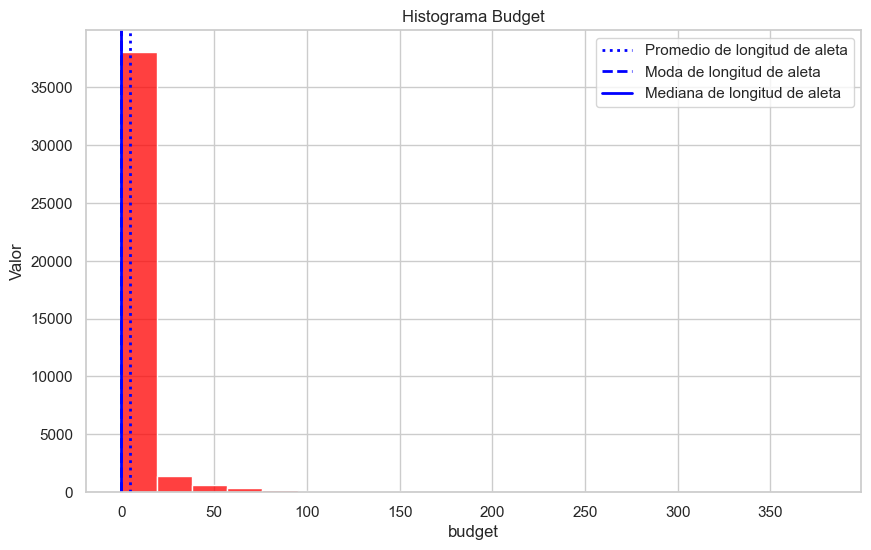

In [25]:
plt.figure(figsize=(10, 6))

sns.histplot(data=etlmovies_df, x='budget', bins=20, color='red')

plt.axvline(
    x=etlmovies_df.budget.mean(),
    color='blue',
    linestyle='dotted',
    linewidth=2,
    label='Promedio de longitud de aleta'
)

plt.axvline(
    x=etlmovies_df.budget.mode()[0],
    color='blue',
    linestyle='dashed',
    linewidth=2,
    label='Moda de longitud de aleta'
)

plt.axvline(
    x=etlmovies_df.budget.median(),
    color='blue',
    linestyle='solid',
    linewidth=2,
    label='Mediana de longitud de aleta'
)

plt.xlabel('budget')
plt.ylabel('Valor')
plt.title('Histograma Budget')
plt.legend()

plt.show()

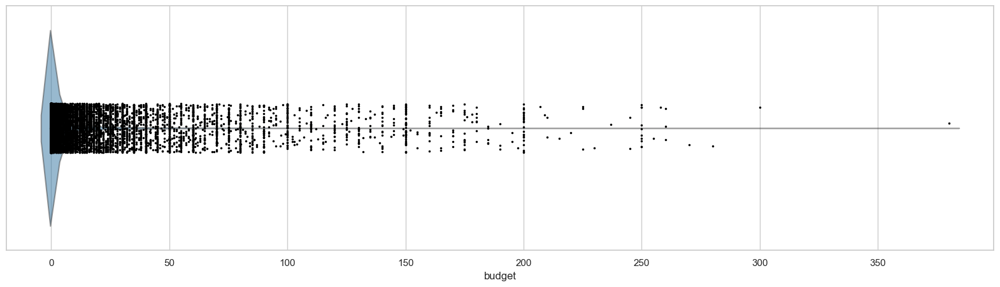

In [26]:
# Crear el boxplot
plt.figure(figsize=(20, 5))

ax=sns.violinplot(data=etlmovies_df, x='budget', orient='h')


# Modificar la transparencia de los violines
for patch in ax.collections:
    patch.set_alpha(0.5)  # Ajustar el valor para cambiar la transparencia de los violines


# Stripplot o Swarmplot
ax=sns.stripplot(data=etlmovies_df['budget'], orient='h', jitter=0.1, color="black", size=2.5)

# Mostrar el gráfico
plt.show()


**POPULARITY**

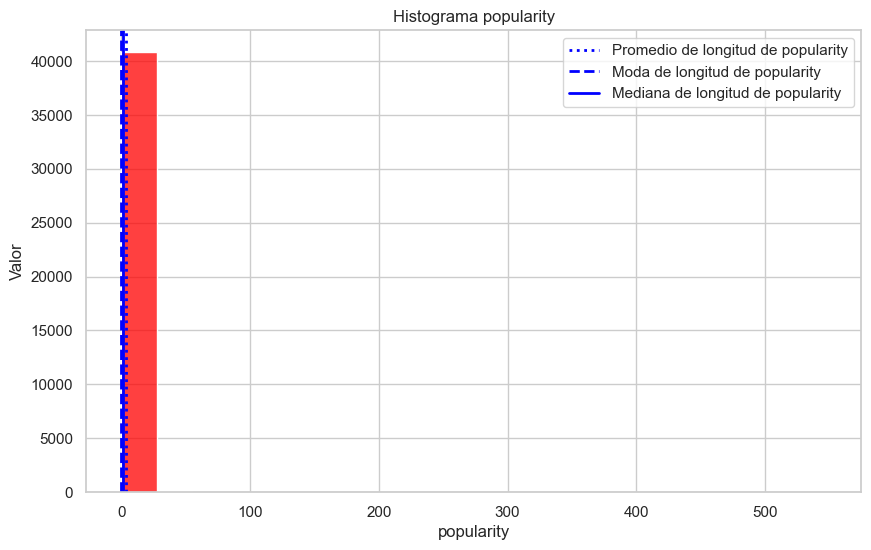

In [27]:
plt.figure(figsize=(10, 6))

sns.histplot(data=etlmovies_df, x='popularity', bins=20, color='red')

plt.axvline(
    x=etlmovies_df.popularity.mean(),
    color='blue',
    linestyle='dotted',
    linewidth=2,
    label='Promedio de longitud de popularity'
)

plt.axvline(
    x=etlmovies_df.popularity.mode()[0],
    color='blue',
    linestyle='dashed',
    linewidth=2,
    label='Moda de longitud de popularity'
)

plt.axvline(
    x=etlmovies_df.popularity.median(),
    color='blue',
    linestyle='solid',
    linewidth=2,
    label='Mediana de longitud de popularity'
)

plt.xlabel('popularity')
plt.ylabel('Valor')
plt.title('Histograma popularity')
plt.legend()

plt.show()

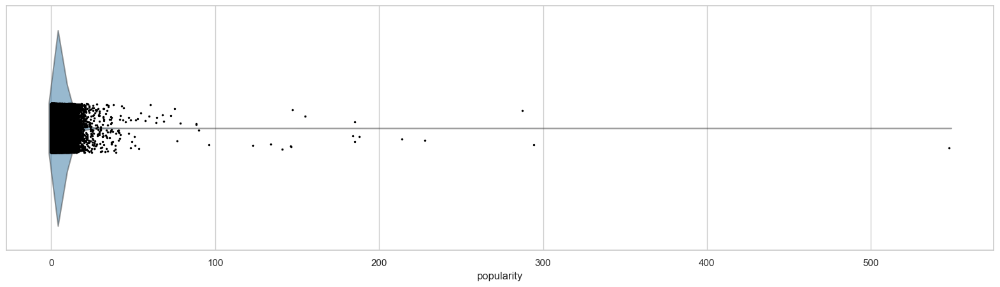

In [28]:
# Crear el boxplot
plt.figure(figsize=(20, 5))

ax=sns.violinplot(data=etlmovies_df, x='popularity', orient='h')


# Modificar la transparencia de los violines
for patch in ax.collections:
    patch.set_alpha(0.5)  # Ajustar el valor para cambiar la transparencia de los violines


# Stripplot o Swarmplot
ax=sns.stripplot(data=etlmovies_df['popularity'], orient='h', jitter=0.1, color="black", size=2.5)

# Mostrar el gráfico
plt.show()


**REVENUE**

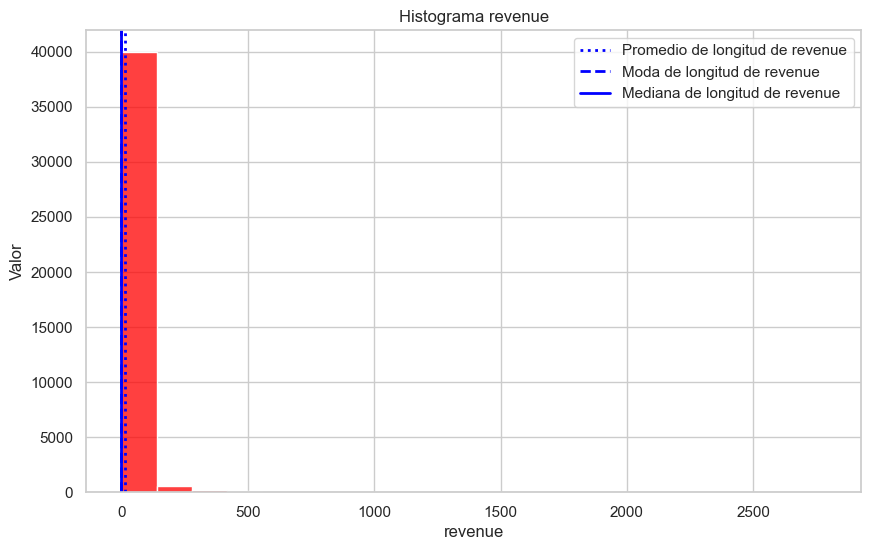

In [29]:
plt.figure(figsize=(10, 6))

sns.histplot(data=etlmovies_df, x='revenue', bins=20, color='red')

plt.axvline(
    x=etlmovies_df.revenue.mean(),
    color='blue',
    linestyle='dotted',
    linewidth=2,
    label='Promedio de longitud de revenue'
)

plt.axvline(
    x=etlmovies_df.revenue.mode()[0],
    color='blue',
    linestyle='dashed',
    linewidth=2,
    label='Moda de longitud de revenue'
)

plt.axvline(
    x=etlmovies_df.revenue.median(),
    color='blue',
    linestyle='solid',
    linewidth=2,
    label='Mediana de longitud de revenue'
)

plt.xlabel('revenue')
plt.ylabel('Valor')
plt.title('Histograma revenue')
plt.legend()

plt.show()

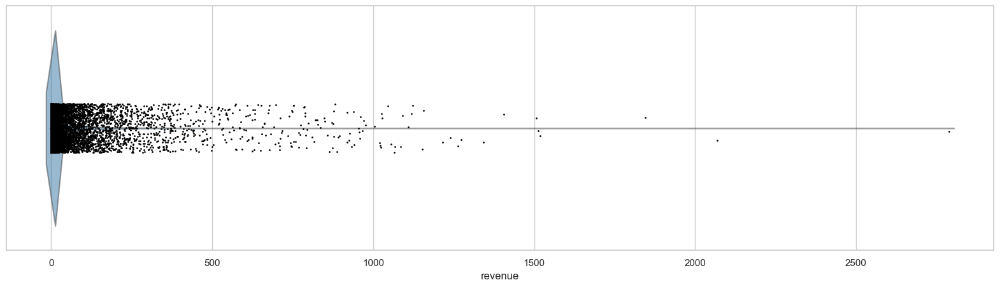

In [30]:
# Crear el boxplot
plt.figure(figsize=(20, 5))

ax=sns.violinplot(data=etlmovies_df, x='revenue', orient='h')


# Modificar la transparencia de los violines
for patch in ax.collections:
    patch.set_alpha(0.5)  # Ajustar el valor para cambiar la transparencia de los violines


# Stripplot o Swarmplot
ax=sns.stripplot(data=etlmovies_df['revenue'], orient='h', jitter=0.1, color="black", size=2)

# Mostrar el gráfico
plt.show()

**RUNTIME**

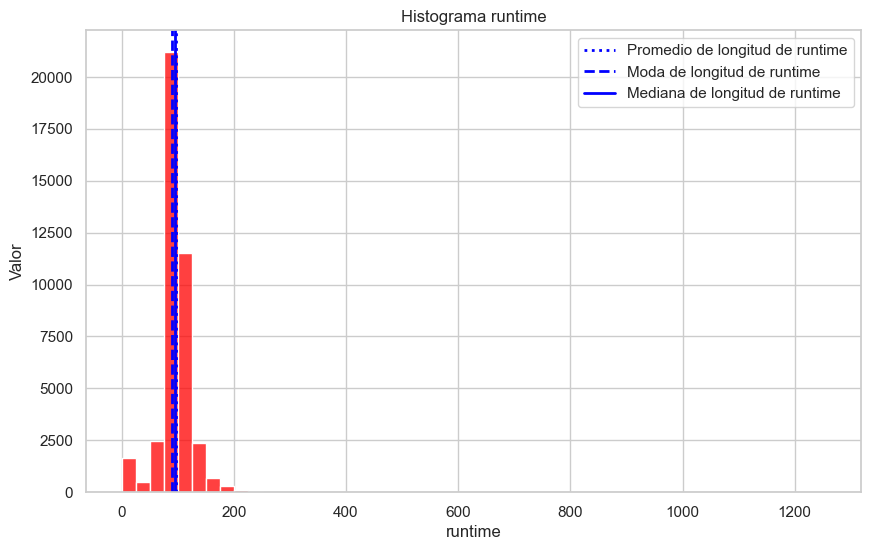

In [31]:
plt.figure(figsize=(10, 6))

sns.histplot(data=etlmovies_df, x='runtime', bins=50, color='red')

plt.axvline(
    x=etlmovies_df.runtime.mean(),
    color='blue',
    linestyle='dotted',
    linewidth=2,
    label='Promedio de longitud de runtime'
)

plt.axvline(
    x=etlmovies_df.runtime.mode()[0],
    color='blue',
    linestyle='dashed',
    linewidth=2,
    label='Moda de longitud de runtime'
)

plt.axvline(
    x=etlmovies_df.runtime.median(),
    color='blue',
    linestyle='solid',
    linewidth=2,
    label='Mediana de longitud de runtime'
)

plt.xlabel('runtime')
plt.ylabel('Valor')
plt.title('Histograma runtime')
plt.legend()

plt.show()

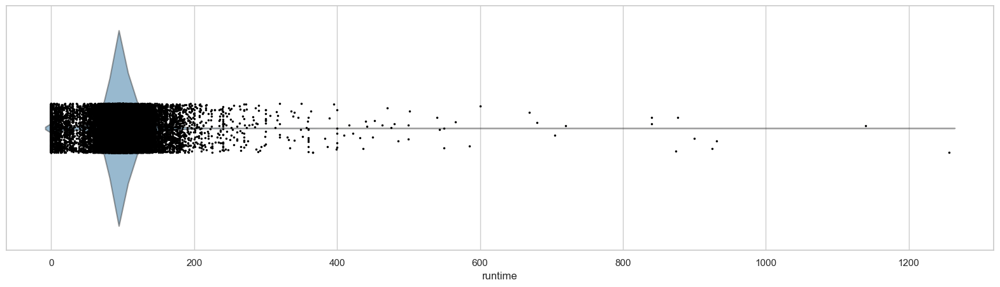

In [32]:
# Crear el boxplot
plt.figure(figsize=(20, 5))

ax=sns.violinplot(data=etlmovies_df, x='runtime', orient='h')


# Modificar la transparencia de los violines
for patch in ax.collections:
    patch.set_alpha(0.5)  # Ajustar el valor para cambiar la transparencia de los violines


# Stripplot o Swarmplot
ax=sns.stripplot(data=etlmovies_df['runtime'], orient='h', jitter=0.1, color="black", size=2.5)

# Mostrar el gráfico
plt.show()

**VOTE AVERAGE**

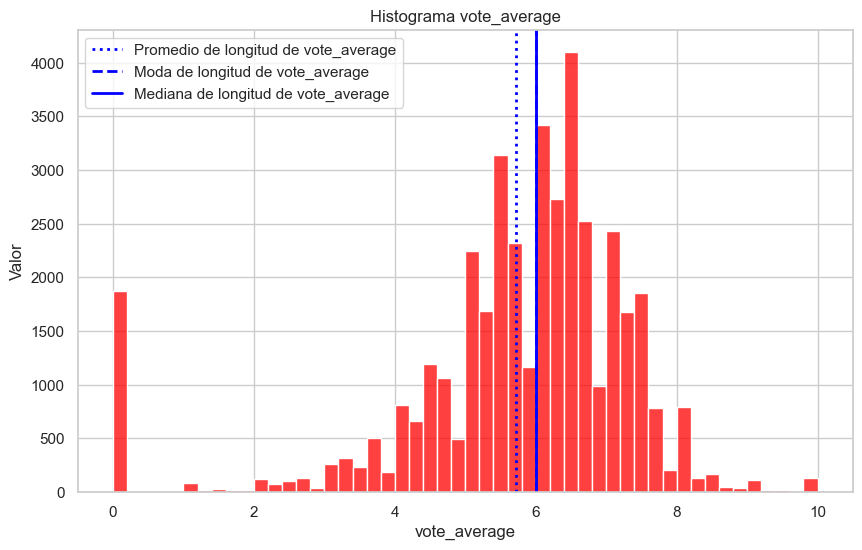

In [33]:
plt.figure(figsize=(10, 6))

sns.histplot(data=etlmovies_df, x='vote_average', bins=50, color='red')

plt.axvline(
    x=etlmovies_df.vote_average.mean(),
    color='blue',
    linestyle='dotted',
    linewidth=2,
    label='Promedio de longitud de vote_average'
)

plt.axvline(
    x=etlmovies_df.vote_average.mode()[0],
    color='blue',
    linestyle='dashed',
    linewidth=2,
    label='Moda de longitud de vote_average'
)

plt.axvline(
    x=etlmovies_df.vote_average.median(),
    color='blue',
    linestyle='solid',
    linewidth=2,
    label='Mediana de longitud de vote_average'
)

plt.xlabel('vote_average')
plt.ylabel('Valor')
plt.title('Histograma vote_average')
plt.legend()

plt.show()

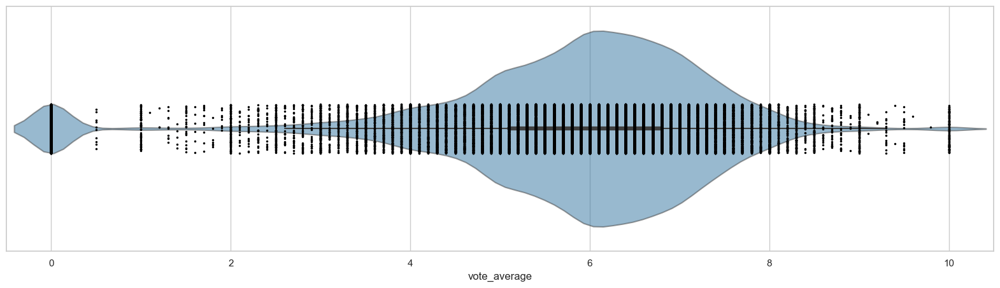

In [34]:
# Crear el boxplot
plt.figure(figsize=(20, 5))

ax=sns.violinplot(data=etlmovies_df, x='vote_average', orient='h')


# Modificar la transparencia de los violines
for patch in ax.collections:
    patch.set_alpha(0.5)  # Ajustar el valor para cambiar la transparencia de los violines


# Stripplot o Swarmplot
ax=sns.stripplot(data=etlmovies_df['vote_average'], orient='h', jitter=0.1, color="black", size=2.5)

# Mostrar el gráfico
plt.show()

**VOTE COUNT**

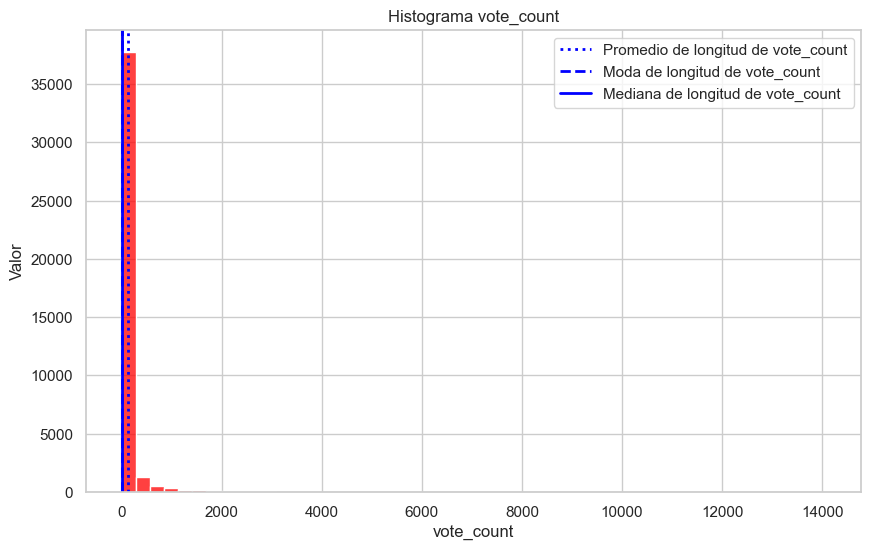

In [35]:
plt.figure(figsize=(10, 6))

sns.histplot(data=etlmovies_df, x='vote_count', bins=50, color='red')

plt.axvline(
    x=etlmovies_df.vote_count.mean(),
    color='blue',
    linestyle='dotted',
    linewidth=2,
    label='Promedio de longitud de vote_count'
)

plt.axvline(
    x=etlmovies_df.vote_count.mode()[0],
    color='blue',
    linestyle='dashed',
    linewidth=2,
    label='Moda de longitud de vote_count'
)

plt.axvline(
    x=etlmovies_df.vote_count.median(),
    color='blue',
    linestyle='solid',
    linewidth=2,
    label='Mediana de longitud de vote_count'
)

plt.xlabel('vote_count')
plt.ylabel('Valor')
plt.title('Histograma vote_count')
plt.legend()

plt.show()

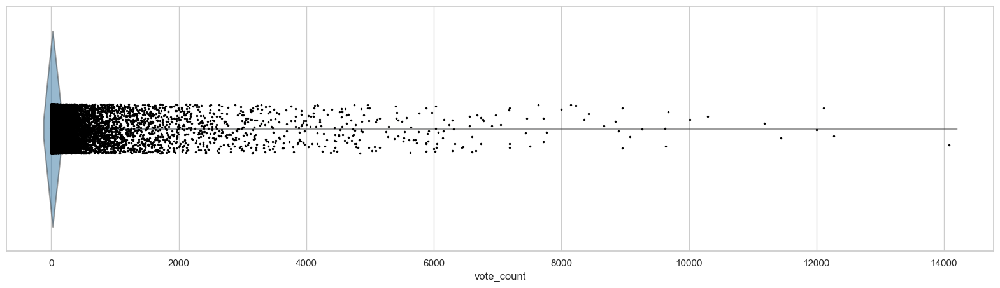

In [36]:
# Crear el boxplot
plt.figure(figsize=(20, 5))

ax=sns.violinplot(data=etlmovies_df, x='vote_count', orient='h')


# Modificar la transparencia de los violines
for patch in ax.collections:
    patch.set_alpha(0.5)  # Ajustar el valor para cambiar la transparencia de los violines


# Stripplot o Swarmplot
ax=sns.stripplot(data=etlmovies_df['vote_count'], orient='h', jitter=0.1, color="black", size=2.5)

# Mostrar el gráfico
plt.show()

**RETURN**

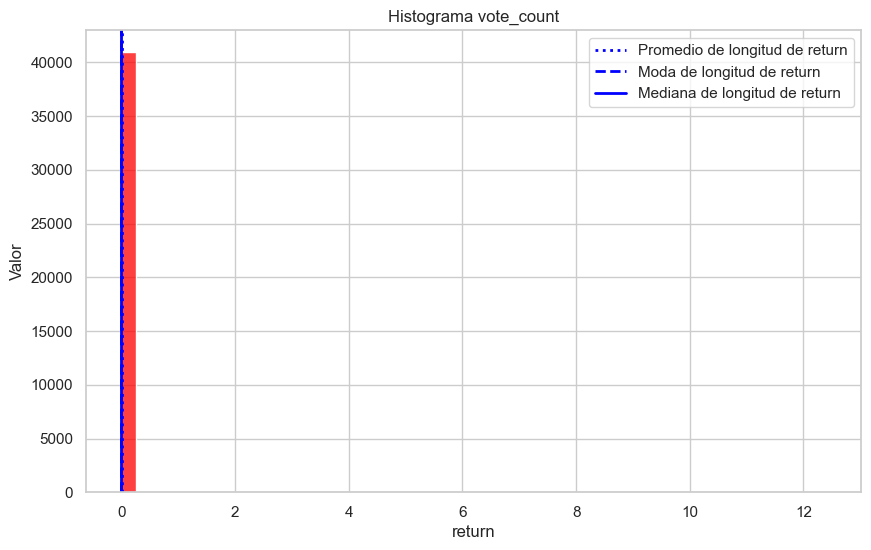

In [37]:
plt.figure(figsize=(10, 6))

sns.histplot(data=etlmovies_df, x='return', bins=50, color='red')

plt.axvline(
    x=etlmovies_df['return'].mean(),
    color='blue',
    linestyle='dotted',
    linewidth=2,
    label='Promedio de longitud de return'
)

plt.axvline(
    x=etlmovies_df['return'].mode()[0],
    color='blue',
    linestyle='dashed',
    linewidth=2,
    label='Moda de longitud de return'
)

plt.axvline(
    x=etlmovies_df['return'].median(),
    color='blue',
    linestyle='solid',
    linewidth=2,
    label='Mediana de longitud de return'
)

plt.xlabel('return')
plt.ylabel('Valor')
plt.title('Histograma vote_count')
plt.legend()

plt.show()

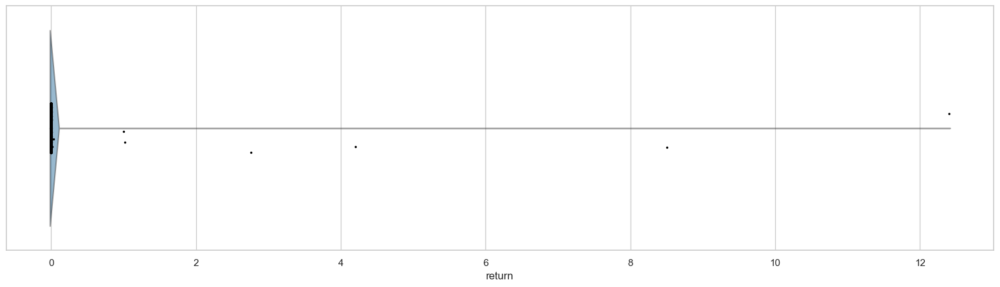

In [38]:
# Crear el boxplot
plt.figure(figsize=(20, 5))

ax=sns.violinplot(data=etlmovies_df, x='return', orient='h')


# Modificar la transparencia de los violines
for patch in ax.collections:
    patch.set_alpha(0.5)  # Ajustar el valor para cambiar la transparencia de los violines


# Stripplot o Swarmplot
ax=sns.stripplot(data=etlmovies_df['return'], orient='h', jitter=0.1, color="black", size=2.5)

# Mostrar el gráfico
plt.show()

# Verificacion de Hipotesis de correlaciones

Coeficientes de Correlaciones

In [39]:
etlmovies_df.corr()

C:\Users\Alarcon Ilbert\AppData\Local\Temp\ipykernel_9880\338743643.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  etlmovies_df.corr()


,budget,id,popularity,revenue,runtime,vote_average,vote_count,return,release_year
budget,1.000000,-0.093168,0.444670,0.768039,0.137596,0.070612,0.674969,-0.002372,0.142092
id,-0.093168,1.000000,-0.060929,-0.064832,-0.095588,-0.133098,-0.055180,-0.006660,0.303162
popularity,0.444670,-0.060929,1.000000,0.504345,0.119056,0.149213,0.557135,0.002842,0.144068
revenue,0.768039,-0.064832,0.504345,1.000000,0.107311,0.086988,0.811381,0.000627,0.095381
runtime,0.137596,-0.095588,0.119056,0.107311,1.000000,0.146093,0.115621,0.000377,0.072537
vote_average,0.070612,-0.133098,0.149213,0.086988,0.146093,1.000000,0.129971,0.005964,0.030231
vote_count,0.674969,-0.055180,0.557135,0.811381,0.115621,0.129971,1.000000,0.003402,0.115394
return,-0.002372,-0.006660,0.002842,0.000627,0.000377,0.005964,0.003402,1.000000,-0.005212
release_year,0.142092,0.303162,0.144068,0.095381,0.072537,0.030231,0.115394,-0.005212,1.000000


C:\Users\Alarcon Ilbert\AppData\Local\Temp\ipykernel_9880\119733017.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data=etlmovies_df.corr(),


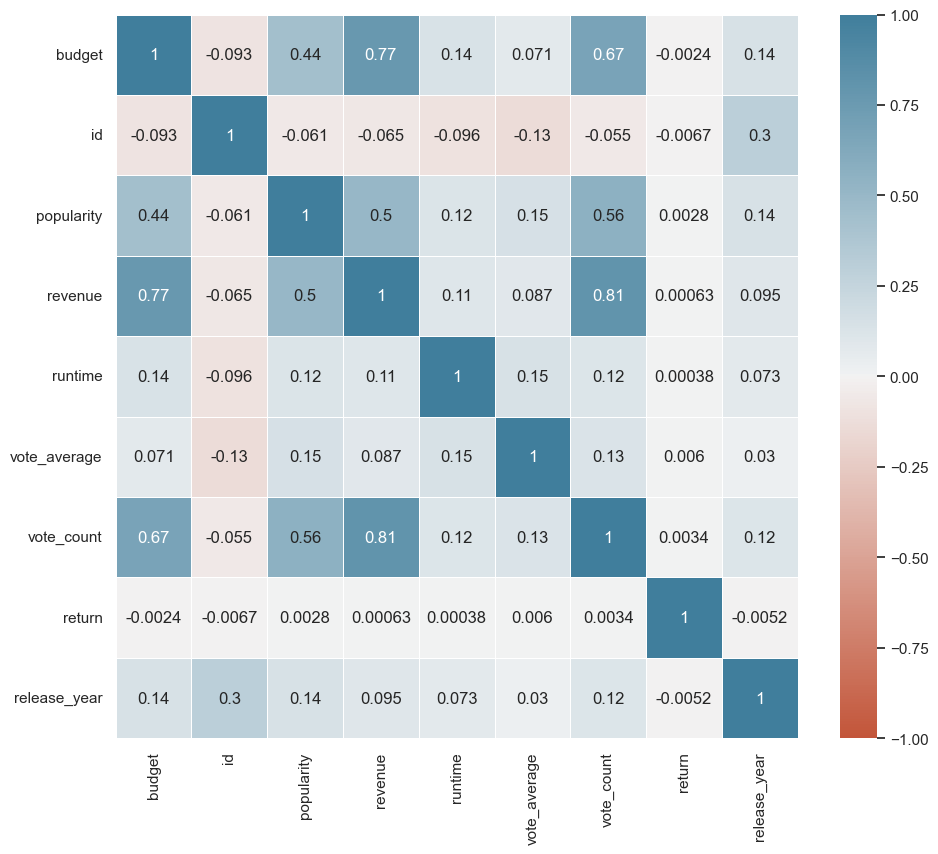

In [40]:
sns.heatmap(
    data=etlmovies_df.corr(),
    cmap=sns.diverging_palette(20,230,as_cmap=True),
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.5,
    annot=True
)

plt.show()

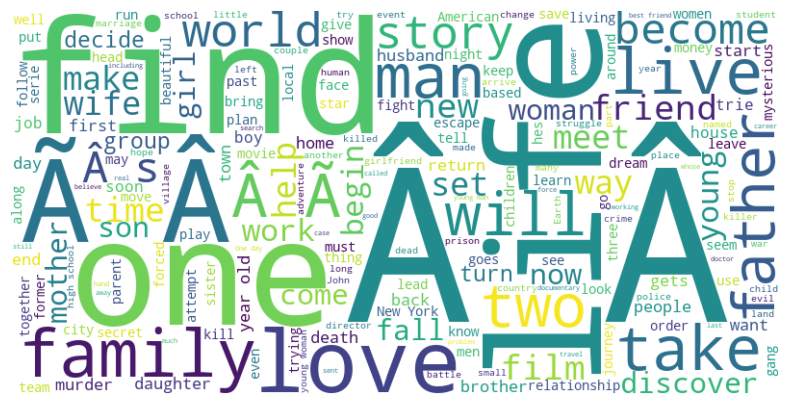

In [41]:
# Obtener todos los textos de la columna 'overview'
texto = ' '.join(etlmovies_df['overview'].dropna())

# Crear el objeto WordCloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(texto)

# Mostrar la nube de palabras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [42]:
etlmovies_df.to_csv('DATASET\Movies_EDA_ILB.csv',index=False)